## Final Project Submission

Please fill out:
* Student name: Paul Narducci
* Student pace: self paced 
* Scheduled project review date/time: 
* Instructor name: 
* Blog post URL:


## Project Questions:
* How does the location of the homes in King County affect the prices of these homes? 
* How do the physical attributes of the homes in King County affect the price of these home?
* How do external factors, such as neighbors, lots, grade, etc., affect the price of the homes in King County? 

## Project Summary

The following project uses a linear regression model in order to determine what features affect the prices of homes in King County, Washington. In order to determine this, I imported the King County data set into this jupyter notebook and began to run a series of data inspections and cleaning before running the linear regression. I removed or replaced missing data, broke my data up into separate continuous and categorical features, and worked with them independently of each other. For continuous data, outliers were removed using z-score and all categorical features were converted into dummy features. Also, any features that were highly correlated with other features were dropped to avoid multicollinearity.

After the features were cleaned and processed, I combined my target variable (price), continuous variables, and categorical variables into one dataframe. I then proceeded to run a series of OLS in order to remove those variables that had p-values greater than 0.05. Once those values were removed, I ran a linear regression in which I split my data into testing and training groups. Once split, I used linear regression in order to fit my X and Y training sets in order to find and store my models coefficients. Once fitted, I then used these coeficients in order to predict new values for my model. Once these new values were determined, I found the RMSE of both the training and testing models in order to compare the training and testing sets to each other, as well as finding the coefficient of determination of my model. These results were then compared with a cross-validation model that I ran. My coefficients of determinations for both ended up being exactly the same, at 0.817 (This will be elaborated on in the results section).

In [1]:
# First, let's import the libraries we are going to use
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

# Ignores warnings
import warnings
warnings.filterwarnings('ignore')

# Used for working with the z-score 
from scipy import stats

#For OLS model
import statsmodels.api as sm
import statsmodels.formula.api as smf
import scipy.stats as stats
import statsmodels.stats.api as sms
from statsmodels.formula.api import ols
import pylab

# Used for Linear Regression model and Cross Validation model
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_squared_error, make_scorer
from sklearn.model_selection import cross_val_score

# Used when showing normalization of data 
from statsmodels.stats.diagnostic import normal_ad

# Used to create maps depicting housing prices in KC. 
# Branca allows us to use colored circles on the map.
# json used to mae Choropleth maps
import folium
import branca.colormap as cm
import json

# Used when creating bar plots and using median instead of mean
from numpy import median

In [2]:
#Now, let's import our King's County housing data and take a look at the first 5 rows of data
kc_data = pd.read_csv('kc_house_data.csv')
kc_data.head()

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,10/13/2014,221900.0,3,1.00,1180,5650,1.0,NaN,0.0,...,7,1180,0.0,1955,0.0,98178,47.5112,-122.257,1340,5650
1,6414100192,12/9/2014,538000.0,3,2.25,2570,7242,2.0,0.0,0.0,...,7,2170,400.0,1951,1991.0,98125,47.7210,-122.319,1690,7639
2,5631500400,2/25/2015,180000.0,2,1.00,770,10000,1.0,0.0,0.0,...,6,770,0.0,1933,NaN,98028,47.7379,-122.233,2720,8062
3,2487200875,12/9/2014,604000.0,4,3.00,1960,5000,1.0,0.0,0.0,...,7,1050,910.0,1965,0.0,98136,47.5208,-122.393,1360,5000
4,1954400510,2/18/2015,510000.0,3,2.00,1680,8080,1.0,0.0,0.0,...,8,1680,0.0,1987,0.0,98074,47.6168,-122.045,1800,7503


In [3]:
#using the .info() method, we will look at some info concerning our data. In particular, 
#we will look at if there is missing data and data types.
kc_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21597 non-null  int64  
 1   date           21597 non-null  object 
 2   price          21597 non-null  float64
 3   bedrooms       21597 non-null  int64  
 4   bathrooms      21597 non-null  float64
 5   sqft_living    21597 non-null  int64  
 6   sqft_lot       21597 non-null  int64  
 7   floors         21597 non-null  float64
 8   waterfront     19221 non-null  float64
 9   view           21534 non-null  float64
 10  condition      21597 non-null  int64  
 11  grade          21597 non-null  int64  
 12  sqft_above     21597 non-null  int64  
 13  sqft_basement  21597 non-null  object 
 14  yr_built       21597 non-null  int64  
 15  yr_renovated   17755 non-null  float64
 16  zipcode        21597 non-null  int64  
 17  lat            21597 non-null  float64
 18  long  

Our info shows that we need to convert date from an object into a date time and sqft_basement from an object into a float value.
We also notice that waterfront, view, yr_renovated have missing data. However, we are not sure if there is more missing data unless we look at it more closely.

In [4]:
for col in kc_data.columns:
    print(col, '\n', kc_data[col].value_counts(normalize=True).head(), '\n\n')

id 
 795000620     0.000139
1825069031    0.000093
2019200220    0.000093
7129304540    0.000093
1781500435    0.000093
Name: id, dtype: float64 


date 
 6/23/2014    0.006575
6/25/2014    0.006066
6/26/2014    0.006066
7/8/2014     0.005880
4/27/2015    0.005834
Name: date, dtype: float64 


price 
 350000.0    0.007964
450000.0    0.007964
550000.0    0.007362
500000.0    0.007038
425000.0    0.006945
Name: price, dtype: float64 


bedrooms 
 3    0.454878
4    0.318655
2    0.127796
5    0.074131
6    0.012594
Name: bedrooms, dtype: float64 


bathrooms 
 2.50    0.248970
1.00    0.178312
1.75    0.141131
2.25    0.094782
2.00    0.089364
Name: bathrooms, dtype: float64 


sqft_living 
 1300    0.006390
1400    0.006251
1440    0.006158
1660    0.005973
1010    0.005973
Name: sqft_living, dtype: float64 


sqft_lot 
 5000    0.016576
6000    0.013428
4000    0.011622
7200    0.010187
7500    0.005510
Name: sqft_lot, dtype: float64 


floors 
 1.0    0.494189
2.0    0.381303
1.5    

After running the cell we notice that sqft_basement also has missing data that we need to deal with. However, let's first convert our data that needs to be converted and turn the '?' values in sqft_basement into NaN values.

In [5]:
#Convert date to date time
kc_data['date'] =  pd.to_datetime(kc_data['date'], format='%m/%d/%Y')
#Convert sqft_basement to float
kc_data['sqft_basement'] = pd.to_numeric(kc_data['sqft_basement'], errors="coerce")
#using errors='coerce' because sqft_basement contains '?' string values. These values will be converted to NaN

In [6]:
print(kc_data.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21597 entries, 0 to 21596
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   id             21597 non-null  int64         
 1   date           21597 non-null  datetime64[ns]
 2   price          21597 non-null  float64       
 3   bedrooms       21597 non-null  int64         
 4   bathrooms      21597 non-null  float64       
 5   sqft_living    21597 non-null  int64         
 6   sqft_lot       21597 non-null  int64         
 7   floors         21597 non-null  float64       
 8   waterfront     19221 non-null  float64       
 9   view           21534 non-null  float64       
 10  condition      21597 non-null  int64         
 11  grade          21597 non-null  int64         
 12  sqft_above     21597 non-null  int64         
 13  sqft_basement  21143 non-null  float64       
 14  yr_built       21597 non-null  int64         
 15  yr_renovated   1775

after running kc_data.info(), we can see that date has been converted to a datetime and sqft_basement has been converted to a float. Now let's handle the missing data.

In [7]:
print(kc_data.isnull().sum())
print(kc_data.shape)

id                  0
date                0
price               0
bedrooms            0
bathrooms           0
sqft_living         0
sqft_lot            0
floors              0
waterfront       2376
view               63
condition           0
grade               0
sqft_above          0
sqft_basement     454
yr_built            0
yr_renovated     3842
zipcode             0
lat                 0
long                0
sqft_living15       0
sqft_lot15          0
dtype: int64
(21597, 21)


In [8]:
#For sqft_basement, waterfront and view, replace missing values with 0
kc_data['sqft_basement'].fillna(0, inplace=True)
kc_data['waterfront'].fillna(0, inplace=True)
kc_data['view'].fillna(0, inplace=True)
#For yr_renovated, set yr_renovated to yr_built
kc_data['yr_renovated'].fillna(kc_data[kc_data['yr_renovated'].isna()]['yr_built'], inplace=True)

In [9]:
print(kc_data.isnull().sum())

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64


The NaN values were handled in this manner for the following reasons:
    1) For sqft_basement, waterfront, and view, we are going to assume that these properties don't have a basement, a waterfront, or were never viewed. It's a difficult assumption to make, but I think it's a better choice than dropping this data from the dataframe.
    2) For yr_renovated, we are going to assume that if a home has a NaN value then it has not been renovated. Therefore, we are going to replace th NaN value for yr_renovated with the yr_built date since the year in which it was built is the only date we have in order to determine when last the home had modifications made to it.

In [10]:
#Let's describe our data now that all our values have been cleaned up.
kc_data.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.159700e+04,2.159700e+04,21597.000000,21597.000000,21597.000000,2.159700e+04,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000,21597.000000
mean,4.580474e+09,5.402966e+05,3.373200,2.115826,2080.321850,1.509941e+04,1.494096,0.006760,0.233181,3.409825,7.657915,1788.596842,285.716581,1970.999676,419.300319,98077.951845,47.560093,-122.213982,1986.620318,12758.283512
std,2.876736e+09,3.673681e+05,0.926299,0.768984,918.106125,4.141264e+04,0.539683,0.081944,0.764673,0.650546,1.173200,827.759761,439.819830,29.375234,807.687934,53.513072,0.138552,0.140724,685.230472,27274.441950
min,1.000102e+06,7.800000e+04,1.000000,0.500000,370.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,3.000000,370.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.220000e+05,3.000000,1.750000,1430.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471100,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.231000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068500e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,550.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


Looking at the information above we can see the following:
    1) Our target variable, Price, has a mean value of roughly 540K. The lowest price is 78K and the highest price is over 7 million. We can also see that 50% of our data falls bellow the 500K price.
    2) We can also see some outliers such as a home with 33 bedrooms and 8 bathrooms.
    3) We also notice that some of our data is categorical, such as zipcode and waterfront.

Now, let's run some graphics in order to better look at our data

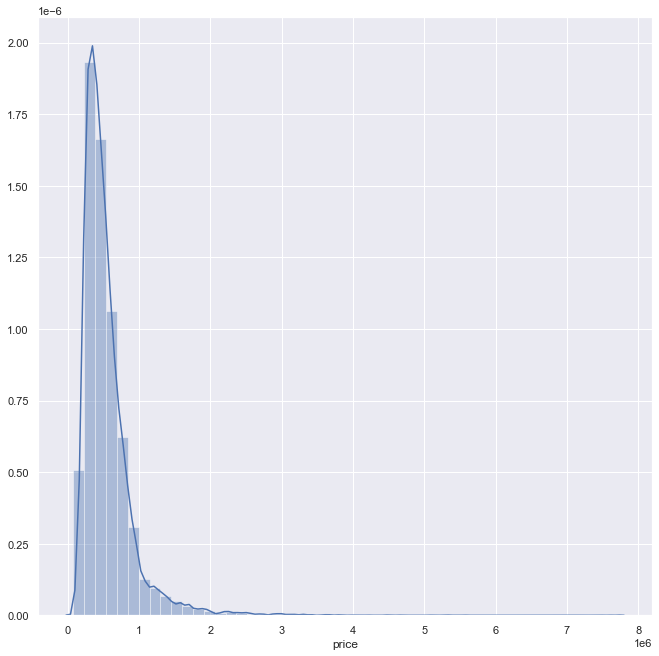

In [11]:
sns.set(rc={'figure.figsize':(11,11)})
sns.distplot(kc_data['price'])
plt.show()

Our distplot above shows that for the majority of our homes, they seem to be priced below 1 million in price.

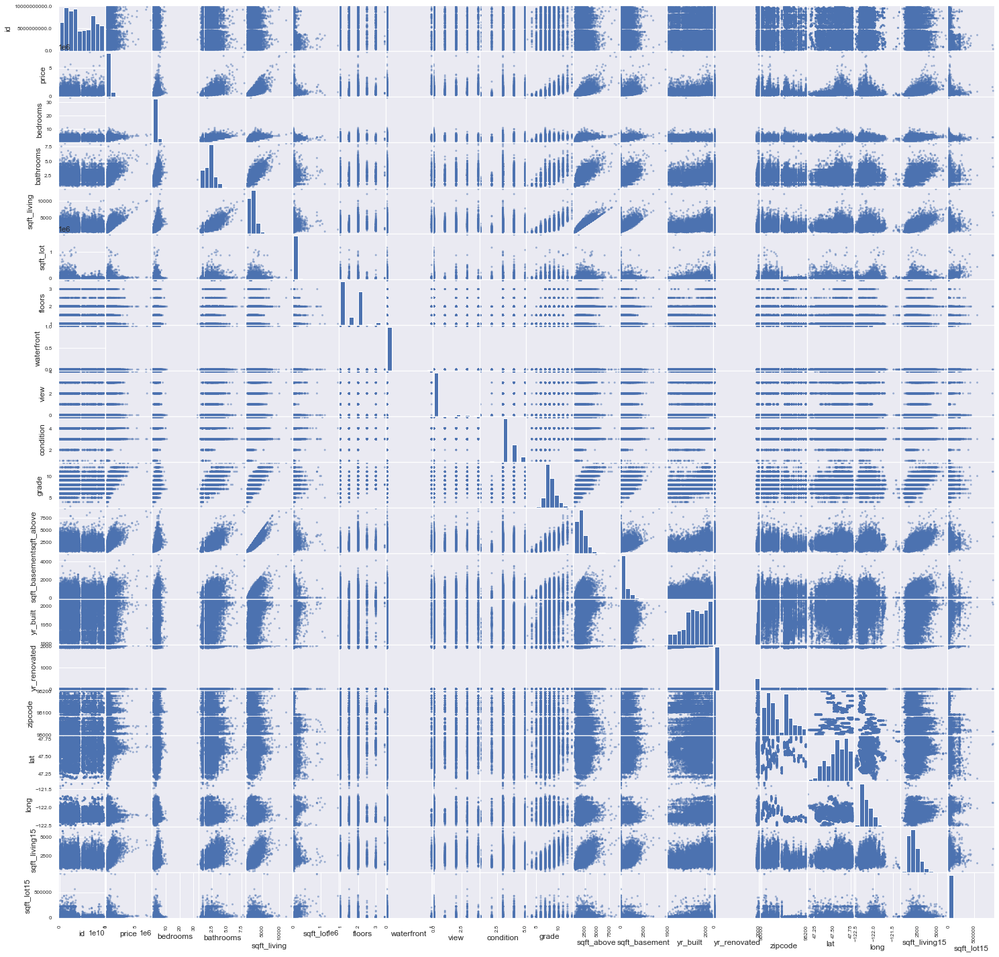

In [12]:
pd.plotting.scatter_matrix(kc_data, figsize=(25,25));

Looking at our scatter matrix above, we can see interesting relationships in our data, but because the data is difficult to actually look at, we are going to use a heatmap in order to better see the correlation in our data set.

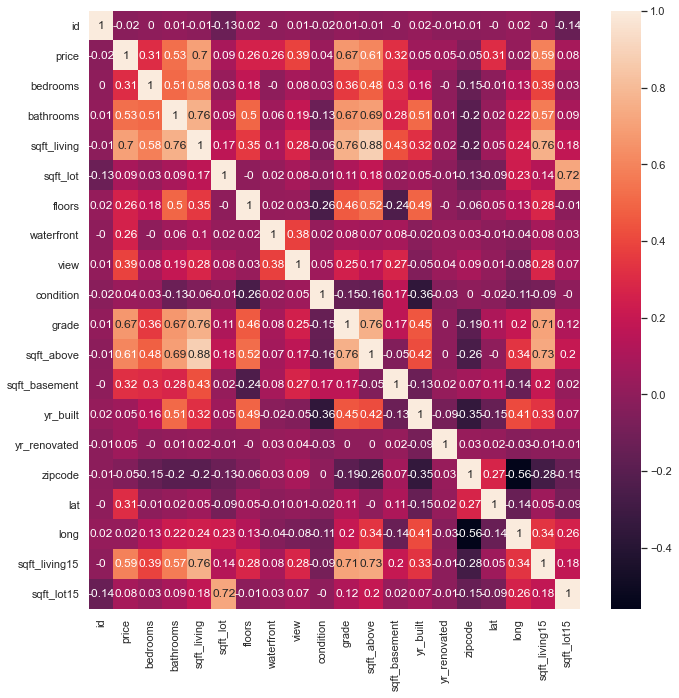

In [13]:
correlation_matrix = kc_data.corr().round(2)
sns.heatmap(data=correlation_matrix, annot=True)

But, even our heatmap is difficult to read. We are going to use a pairwise correlation in order to determine which values are highly correlated with our target (price) by using any value greater than 0.70.

In [14]:
abs(kc_data.corr()) > 0.70

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
price,False,True,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,False,True,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,True,False,True,True,False,False,False,False,False,True,True,False,False,False,False,False,False,True,False
sqft_lot,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,True
floors,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False


Based upon the info above, we can see the following:
    1) price, our target variable, is highly correlated with sqft_living(0.70)

However, we need to also know which features have high multi-collinearity with each other. Let's run the same pairwise correlation, but look for correlated values with a value equal to or grater than .80

In [15]:
abs(kc_data.corr()) > 0.80

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
id,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
price,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,False,True,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False
sqft_lot,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False,False
floors,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False,False
waterfront,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False,False
condition,False,False,False,False,False,False,False,False,False,True,False,False,False,False,False,False,False,False,False,False


We can see that sqft_living and sqft_above are highly correlated. According to our heat map they have a correlation of .88. In order to remove multi-collinearity from our data, we are going to drop sqft_above from our data set. We are also going to drop id and date.

In [16]:
new_kc_data = kc_data.drop(['sqft_above', 'id', 'date'], axis=1)

In [17]:
new_kc_data.keys()

Index(['price', 'bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors',
       'waterfront', 'view', 'condition', 'grade', 'sqft_basement', 'yr_built',
       'yr_renovated', 'zipcode', 'lat', 'long', 'sqft_living15',
       'sqft_lot15'],
      dtype='object')

In [18]:
#Now, let's place our continuous and categorical data into a separate features
cont_data = new_kc_data[['price','bedrooms', 'bathrooms', 'sqft_living', 'sqft_lot', 'floors', 'view', 'sqft_basement', 'yr_built', 'yr_renovated', 'lat', 'long', 'sqft_living15', 'sqft_lot15']]
cat_data = new_kc_data[['waterfront', 'condition', 'grade', 'zipcode']]

Let's first work with our continuous data and look for outliers in the data. 

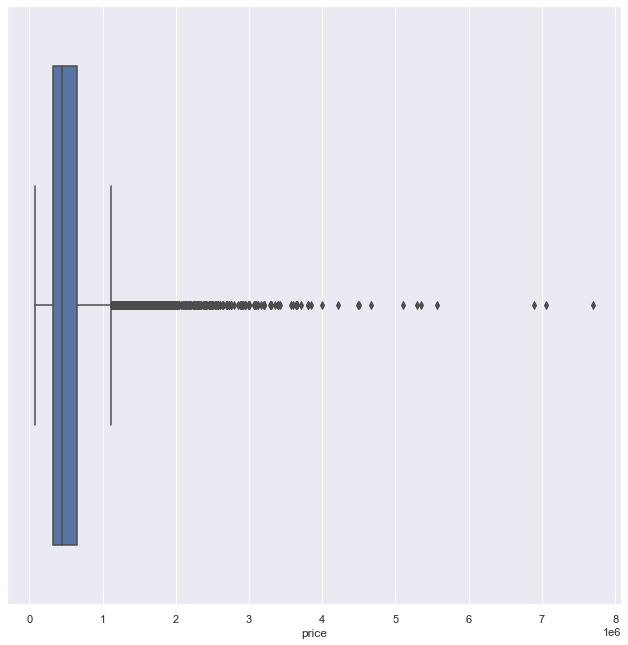

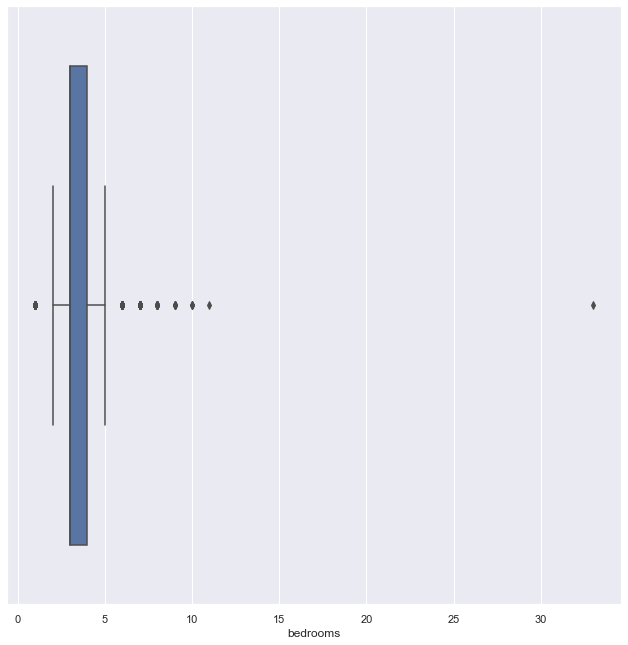

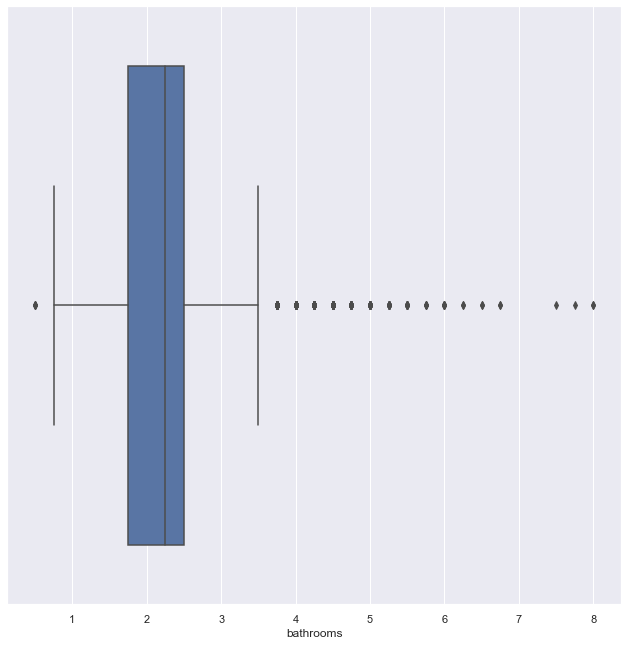

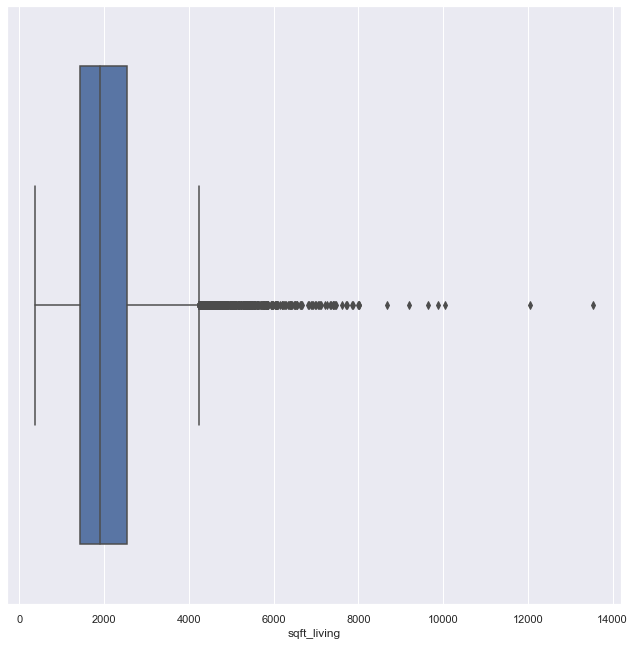

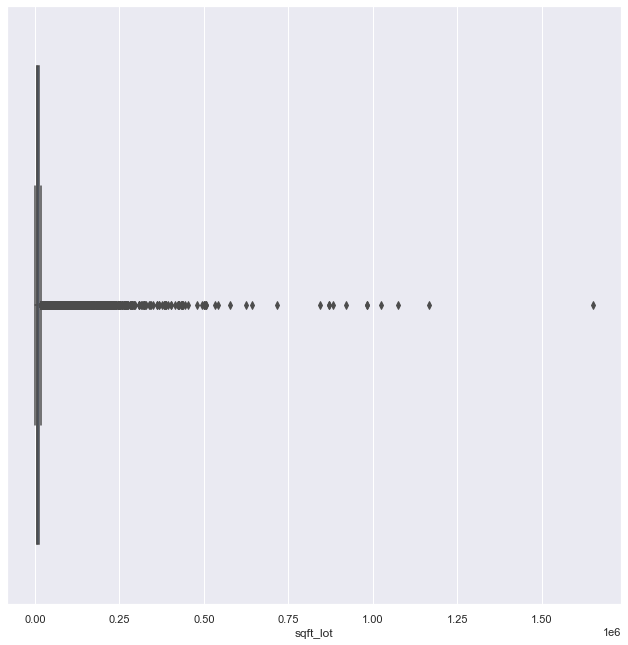

...

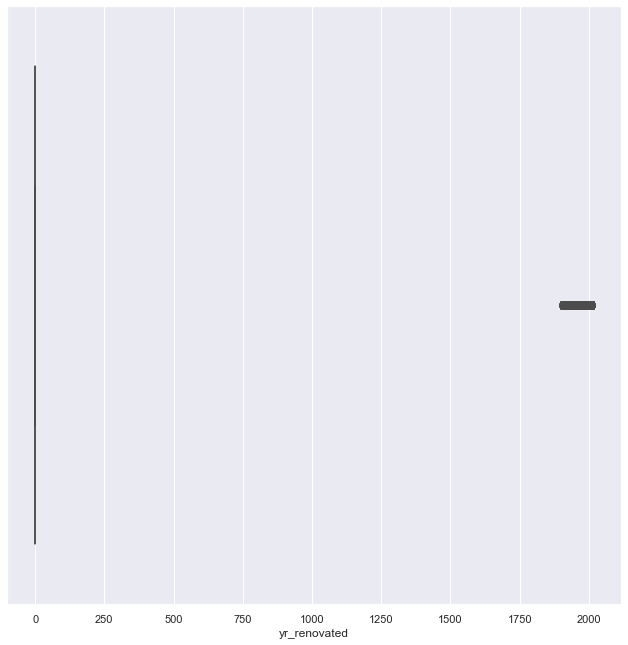

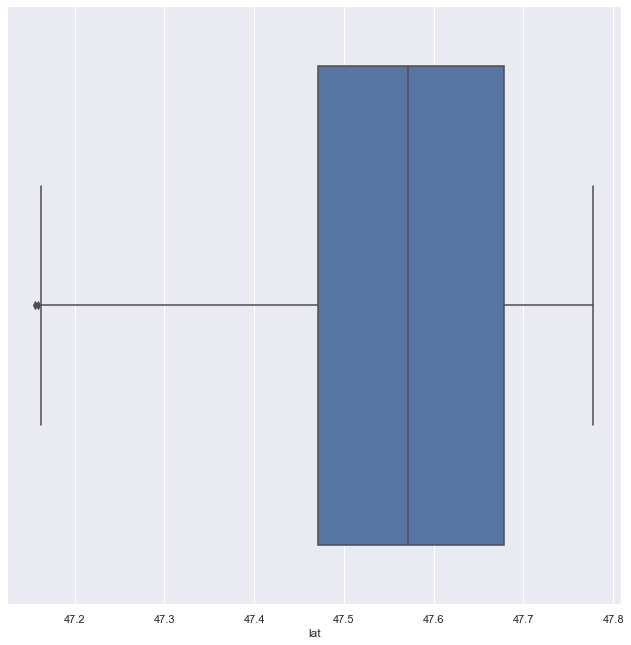

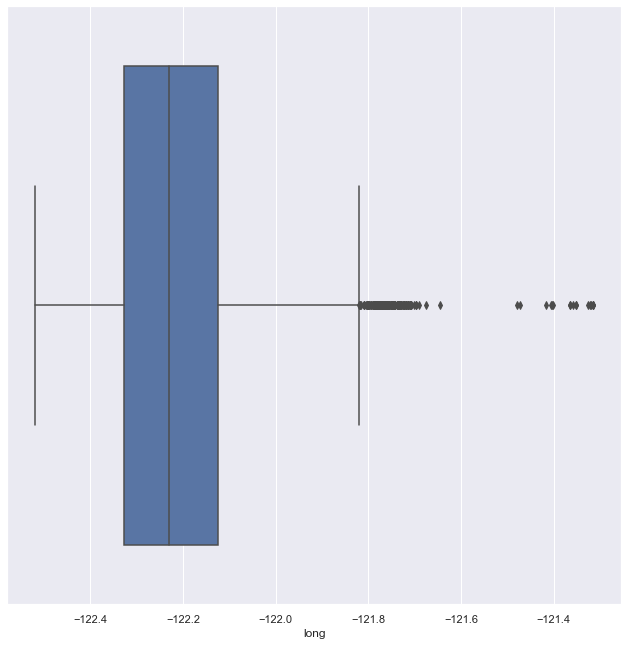

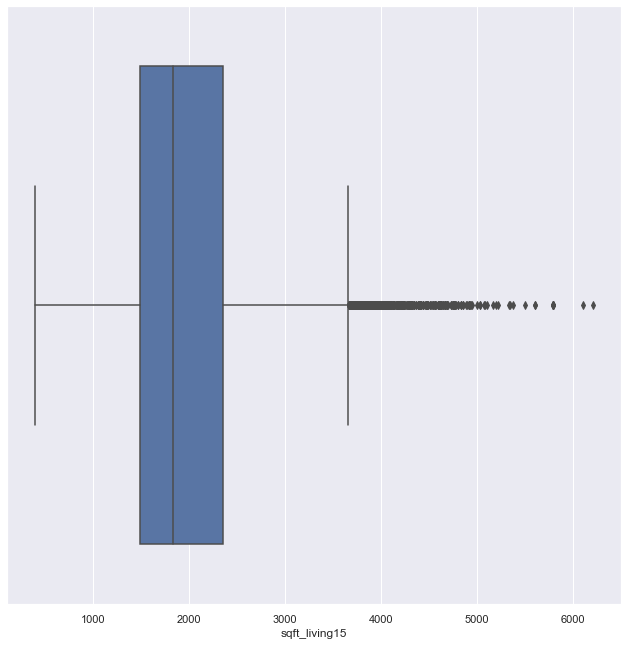

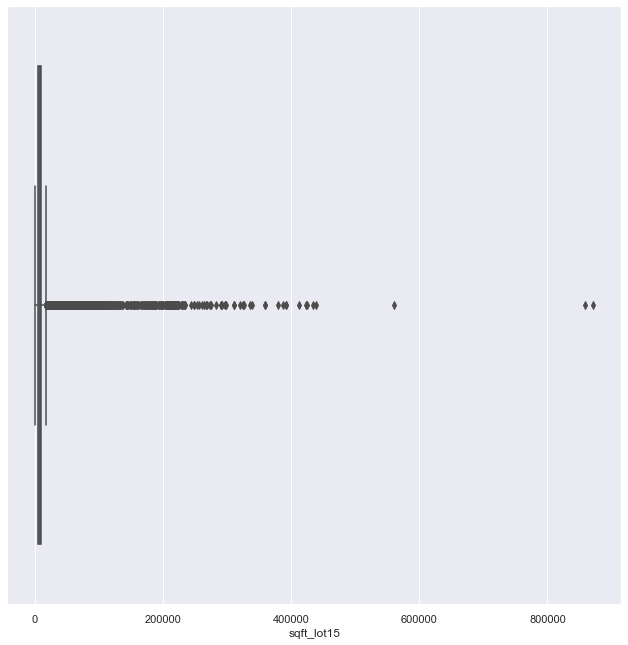

In [19]:
for i, col in enumerate(cont_data.columns):
    plt.figure(i)
    sns.boxplot(x=col, data=cont_data)

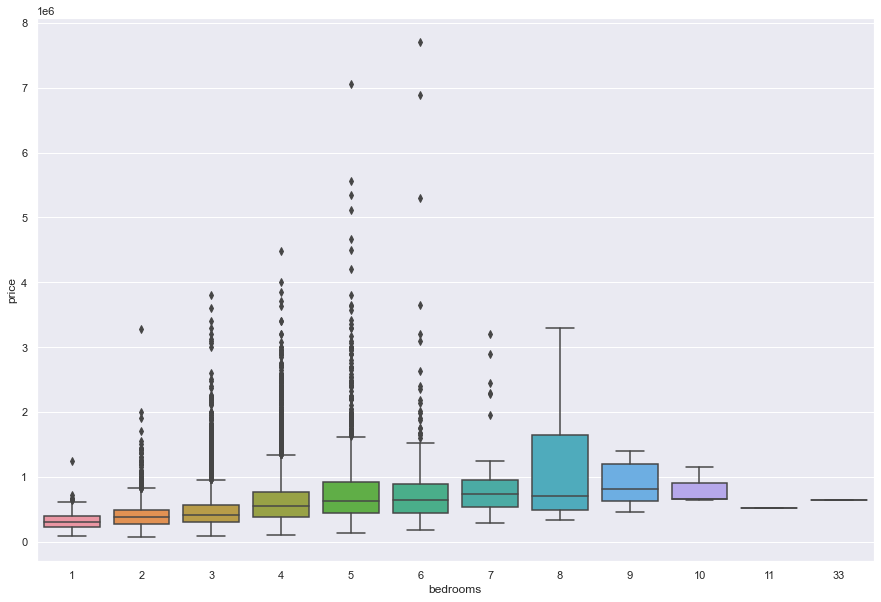

In [20]:
plt.figure(figsize=(15,10))
sns.boxplot(x=cont_data['bedrooms'], y=cont_data['price'], data=cont_data)

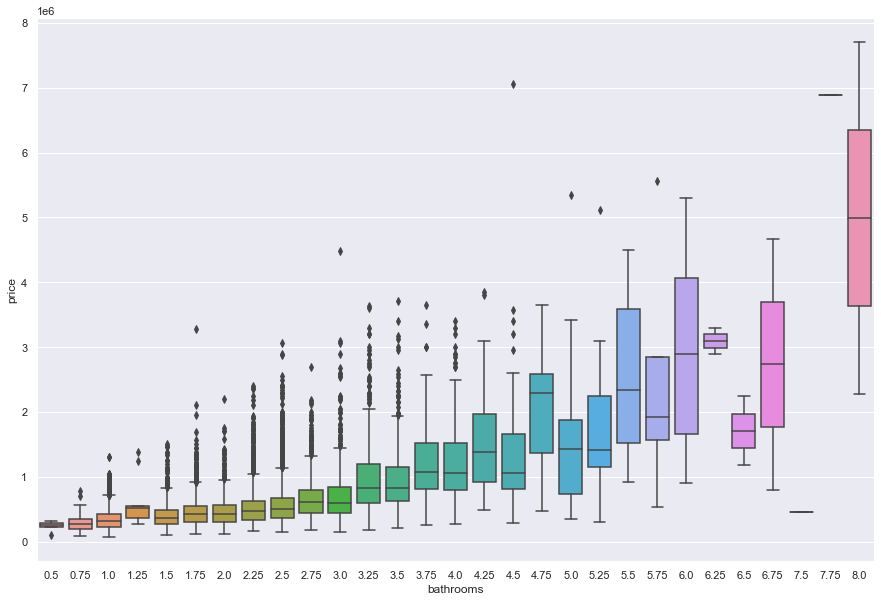

In [21]:
plt.figure(figsize=(15,10))
sns.boxplot(x=cont_data['bathrooms'], y=cont_data['price'], data=cont_data)

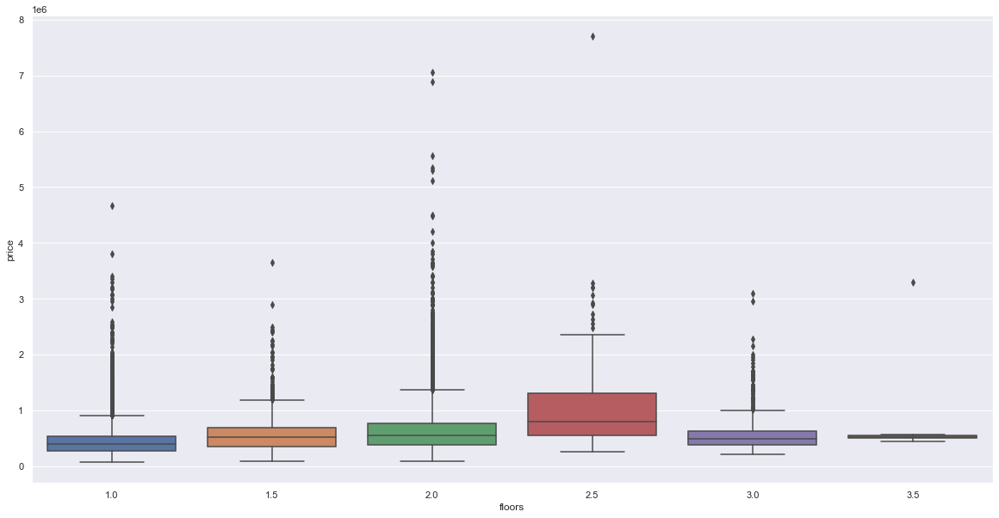

In [22]:
plt.figure(figsize=(20,10))
sns.boxplot(x=cont_data['floors'], y=cont_data['price'])

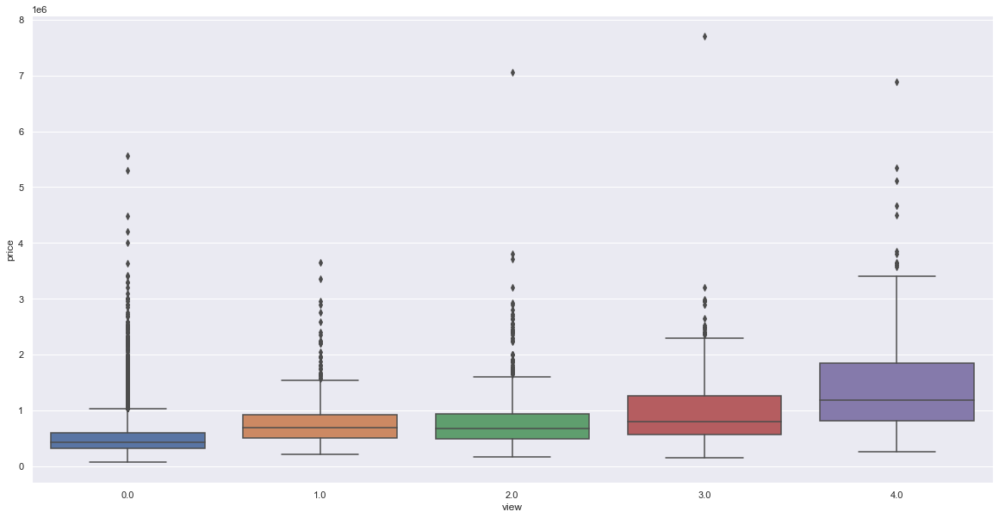

In [23]:
plt.figure(figsize=(20,10))
sns.boxplot(x=cont_data['view'], y=cont_data['price'])

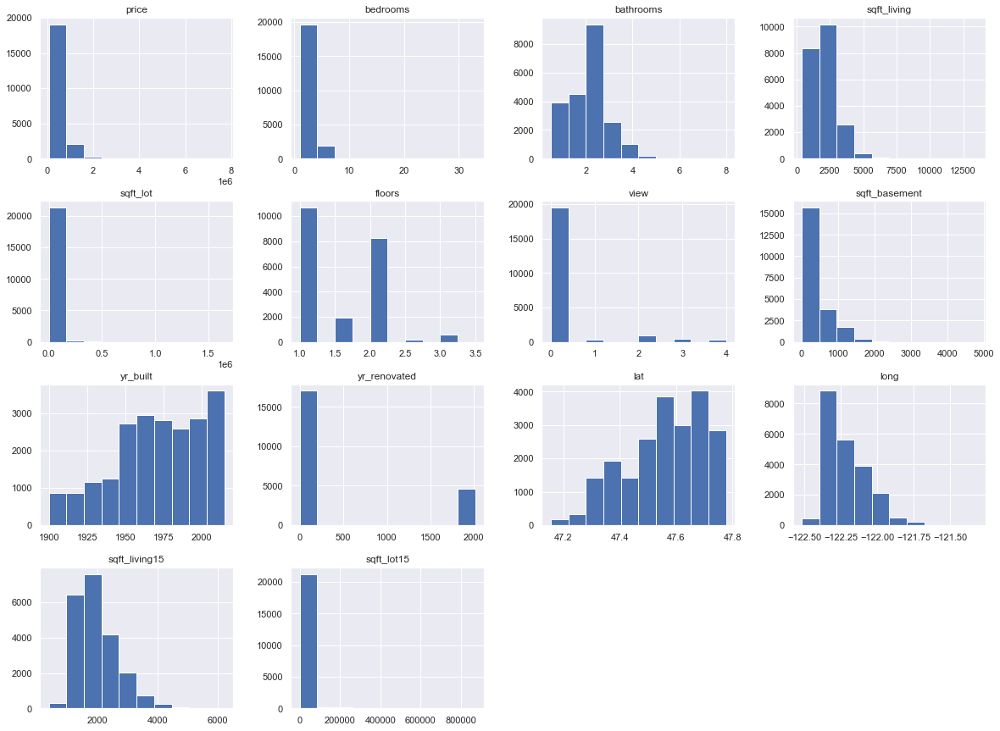

In [24]:
fig = plt.figure(figsize = (20,15))
ax = fig.gca()
cont_data.hist(ax = ax);

We can see from the box plots and histograms above that many of our continuos data have outliers that need to be removed, since our investigation is focused on if lower or middle class families can afford homes in King's County Seattle. Let's remove those outliers.

In order to restructure our data we are going to use the Z-score in order to determine what outliers should be removed from our data set.

In [25]:
cont_data.shape

(21597, 14)

In [26]:
z_cont = np.abs(stats.zscore(cont_data))

In [27]:
cont_data_out = cont_data[(z_cont < 3).all(axis=1)]

In [28]:
cont_data_out.shape

(19517, 14)

As you can see, any rows outside three standard deviations from the mean were removed. Let's look at some examples of these changes.

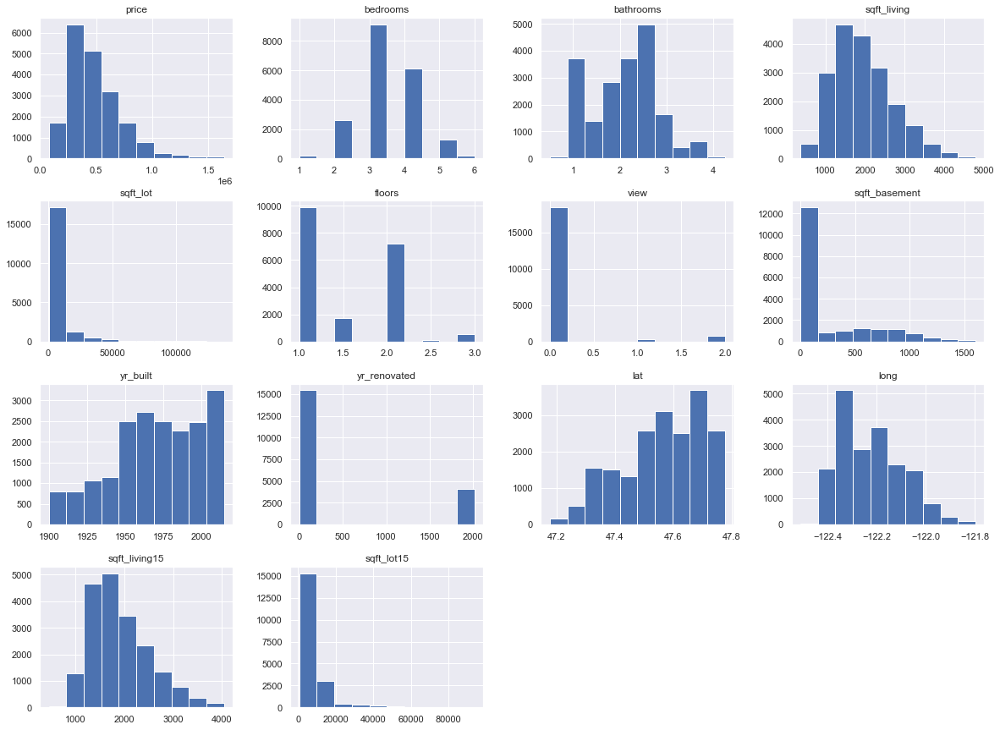

In [29]:
fig = plt.figure(figsize = (20,15))
ax = fig.gca()
cont_data_out.hist(ax = ax);

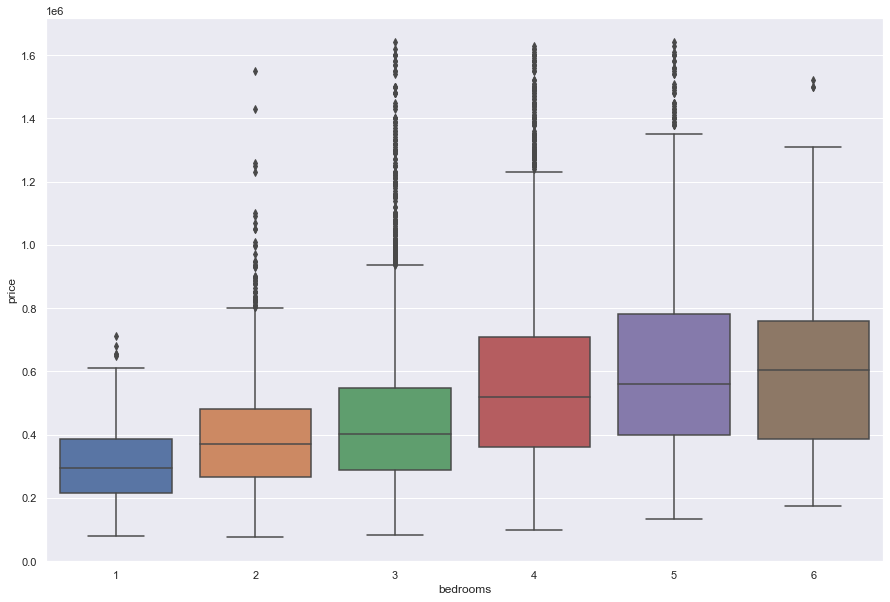

In [30]:
plt.figure(figsize=(15,10))
sns.boxplot(x=cont_data_out['bedrooms'], y=cont_data_out['price'], data=cont_data_out)

Let's run an OLS and see how our continuous data works with our model so far.

In [31]:
#Let's make a continuous data feature and a feature for our target variable
target = cont_data_out['price']
cont_feat = cont_data_out.drop('price', axis=1)

In [32]:
outcome = 'price'
x_cols = cont_feat
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model = ols(formula=formula, data=cont_data_out).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     2460.
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:13:02   Log-Likelihood:            -2.5979e+05
No. Observations:               19517   AIC:                         5.196e+05
Df Residuals:                   19503   BIC:                         5.197e+05
Df Model:                          13                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -3.816e+07   1.31e+06    -29.173      0.000   -4.07e+07   -3.56e+07
bedrooms      -2.336e+04   1587.161    -14.718      0.000   -2.65e+04   -2.02e+04
bathrooms      4.622e+04   2611.876     17.697      0.000    4.11e+04    5.13e+04
sqft_living     153.9885      3.001     51.319      0.000     148.107     159.870
sqft_lot          0.1532      0.156      0.979      0.327      -0.153       0.460
floors         3.563e+04   2809.823     12.680      0.000    3.01e+04    4.11e+04
view           4.449e+04   2651.650     16.780      0.000    3.93e+04    4.97e+04
sqft_basement   -26.2658      3.616     -7.264      0.000     -33.353     -19.178
yr_built      -1799.7879     50.188    -35.861      0.000   -1898.160   -1701.415
yr_renovated      3.0913      1.312      2.356      0.018       0.520       5.663
lat            5.987e+05   7798.069     76.777      0.000    5.83e+05    6.14e+05
long          -1.079e+05   1.01e+04    -10.665      0.000   -1.28e+05   -8.81e+04
sqft_living15    86.7632      2.830     30.662      0.000      81.217      92.310
sqft_lot15       -0.9055      0.203     -4.466      0.000      -1.303      -0.508
==============================================================================
Omnibus:                     4974.485   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19757.470
Skew:                           1.219   Prob(JB):                         0.00
Kurtosis:                       7.283   Cond. No.                     2.45e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.45e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

We still have high multicollinearity so we are going to look for any features with a p-value greater than .75 and remove one of those features from our data table.

In [33]:
abs(cont_data_out.corr()) > 0.75

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,sqft_basement,yr_built,yr_renovated,lat,long,sqft_living15,sqft_lot15
price,True,False,False,False,False,False,False,False,False,False,False,False,False,False
bedrooms,False,True,False,False,False,False,False,False,False,False,False,False,False,False
bathrooms,False,False,True,False,False,False,False,False,False,False,False,False,False,False
sqft_living,False,False,False,True,False,False,False,False,False,False,False,False,False,False
sqft_lot,False,False,False,False,True,False,False,False,False,False,False,False,False,True
floors,False,False,False,False,False,True,False,False,False,False,False,False,False,False
view,False,False,False,False,False,False,True,False,False,False,False,False,False,False
sqft_basement,False,False,False,False,False,False,False,True,False,False,False,False,False,False
yr_built,False,False,False,False,False,False,False,False,True,False,False,False,False,False
yr_renovated,False,False,False,False,False,False,False,False,False,True,False,False,False,False


In [34]:
#Let's drop sqft_lot15 since it has high multicolinearity with sqft_living15
new_cont_feat = cont_feat.drop('sqft_lot15', axis=1)

In [35]:
outcome = 'price'
x_cols = new_cont_feat
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model = ols(formula=formula, data=cont_data_out).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.621
Model:                            OLS   Adj. R-squared:                  0.621
Method:                 Least Squares   F-statistic:                     2661.
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:13:02   Log-Likelihood:            -2.5980e+05
No. Observations:               19517   AIC:                         5.196e+05
Df Residuals:                   19504   BIC:                         5.197e+05
Df Model:                          12                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -3.872e+07    1.3e+06    -29.728      0.000   -4.13e+07   -3.62e+07
bedrooms      -2.326e+04   1587.785    -14.652      0.000   -2.64e+04   -2.02e+04
bathrooms      4.653e+04   2612.215     17.813      0.000    4.14e+04    5.17e+04
sqft_living     153.6730      3.001     51.203      0.000     147.790     159.556
sqft_lot         -0.3894      0.099     -3.950      0.000      -0.583      -0.196
floors         3.653e+04   2803.959     13.028      0.000     3.1e+04     4.2e+04
view            4.46e+04   2652.834     16.811      0.000    3.94e+04    4.98e+04
sqft_basement   -25.9961      3.617     -7.187      0.000     -33.086     -18.906
yr_built      -1800.9630     50.212    -35.867      0.000   -1899.382   -1702.544
yr_renovated      3.0680      1.313      2.337      0.019       0.495       5.641
lat            5.989e+05   7801.752     76.763      0.000    5.84e+05    6.14e+05
long          -1.124e+05   1.01e+04    -11.164      0.000   -1.32e+05   -9.27e+04
sqft_living15    85.7425      2.822     30.386      0.000      80.212      91.273
==============================================================================
Omnibus:                     4958.031   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.000   Jarque-Bera (JB):            19568.361
Skew:                           1.217   Prob(JB):                         0.00
Kurtosis:                       7.259   Cond. No.                     1.92e+07
==============================================================================

Warnings:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.92e+07. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Now let's work with our categorical data and create dummy variables so that we can use them in our regresion model.

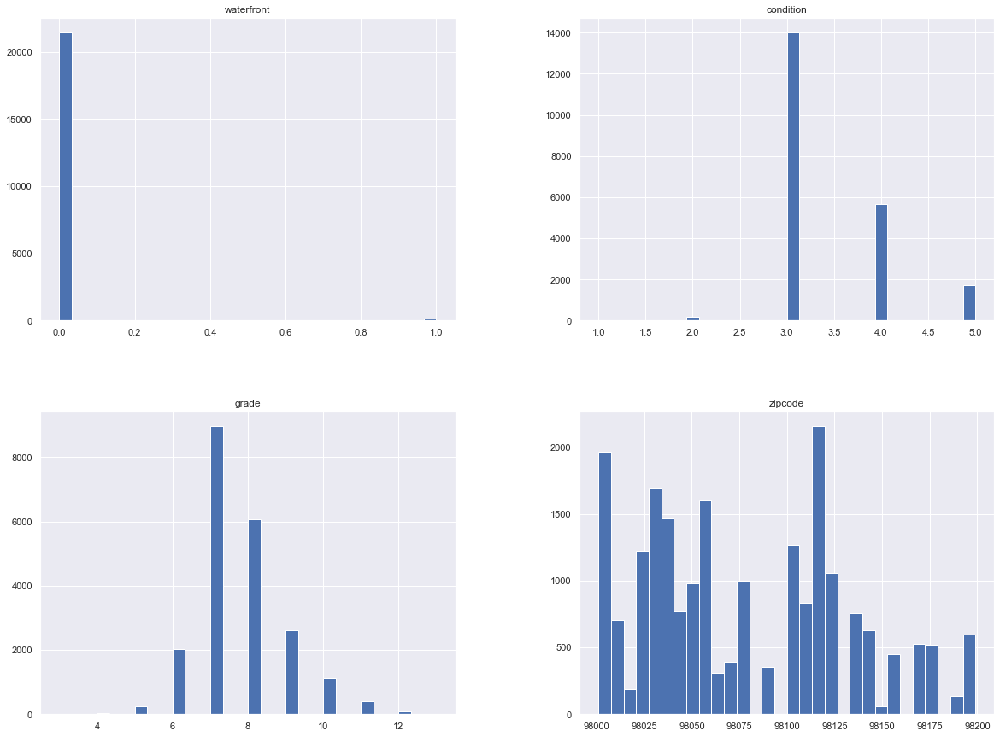

In [36]:
fig = plt.figure(figsize = (20,15))
ax = fig.gca()
cat_data.hist(ax = ax, bins=30);

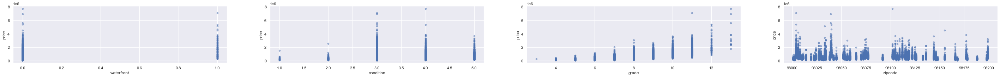

In [37]:
fig, axes = plt.subplots(nrows=1, ncols=4, figsize=(50,3))

for xcol, ax in zip(cat_data, axes):
    kc_data.plot(kind='scatter', x=xcol, y='price', ax=ax, alpha=0.5, color='b')

In [38]:
#Let's create our dummy variables
cond_dummies = pd.get_dummies(cat_data['condition'], prefix='cond', drop_first=True)
grade_dummies = pd.get_dummies(cat_data['grade'], prefix='grade', drop_first=True)
zc_dummies = pd.get_dummies(cat_data['zipcode'], prefix='zc', drop_first=True)

In [39]:
#Let's create one feature containing all of our dummies
cat_dummies = pd.concat([cond_dummies, grade_dummies, zc_dummies, cat_data['waterfront']], axis=1)

In [40]:
# Let's combine all of our features into one dataframe and drop any NaN values
kc_data_fin = pd.concat([target, new_cont_feat, cat_dummies], axis=1)
kc_data_fin.dropna(how='any', inplace=True)

Now let's run an OLS and remove the features that have high p-values

In [41]:
outcome = 'price'
x_cols = kc_data_fin.drop('price', axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model = ols(formula=formula, data=kc_data_fin).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.837
Model:                            OLS   Adj. R-squared:                  0.836
Method:                 Least Squares   F-statistic:                     1049.
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:13:05   Log-Likelihood:            -2.5157e+05
No. Observations:               19517   AIC:                         5.033e+05
Df Residuals:                   19421   BIC:                         5.041e+05
Df Model:                          95                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -1.999e+07   4.99e+06     -4.005      0.000   -2.98e+07   -1.02e+07
bedrooms      -2330.5937   1087.226     -2.144      0.032   -4461.650    -199.537
bathrooms      2.303e+04   1754.523     13.129      0.000    1.96e+04    2.65e+04
sqft_living     124.6888      2.201     56.644      0.000     120.374     129.004
sqft_lot          0.7145      0.071     10.076      0.000       0.576       0.854
floors        -1.974e+04   2053.927     -9.610      0.000   -2.38e+04   -1.57e+04
view            3.85e+04   1785.007     21.567      0.000     3.5e+04     4.2e+04
sqft_basement   -43.8578      2.536    -17.292      0.000     -48.829     -38.886
yr_built       -506.1986     40.552    -12.483      0.000    -585.684    -426.713
yr_renovated      3.8655      0.868      4.456      0.000       2.165       5.566
lat            1.091e+05   4.19e+04      2.602      0.009    2.69e+04    1.91e+05
long          -1.296e+05   3.96e+04     -3.271      0.001   -2.07e+05    -5.2e+04
sqft_living15    20.4691      2.028     10.093      0.000      16.494      24.444
cond_2         4.189e+04   2.05e+04      2.040      0.041    1643.773    8.21e+04
cond_3         6.776e+04   1.91e+04      3.549      0.000    3.03e+04    1.05e+05
cond_4         8.563e+04   1.91e+04      4.482      0.000    4.82e+04    1.23e+05
cond_5         1.211e+05   1.92e+04      6.303      0.000    8.35e+04    1.59e+05
grade_4       -1.177e+05   9.82e+04     -1.198      0.231    -3.1e+05    7.49e+04
grade_5       -1.412e+05   9.67e+04     -1.461      0.144   -3.31e+05    4.83e+04
grade_6       -1.352e+05   9.65e+04     -1.402      0.161   -3.24e+05    5.39e+04
grade_7       -1.161e+05   9.65e+04     -1.204      0.229   -3.05e+05     7.3e+04
grade_8       -7.752e+04   9.65e+04     -0.803      0.422   -2.67e+05    1.12e+05
grade_9        9135.2131   9.66e+04      0.095      0.925    -1.8e+05    1.98e+05
grade_10       7.785e+04   9.67e+04      0.805      0.421   -1.12e+05    2.67e+05
grade_11       1.808e+05    9.7e+04      1.865      0.062   -9242.790    3.71e+05
grade_12        3.21e+05   1.04e+05      3.074      0.002    1.16e+05    5.26e+05
grade_13       -5.41e-08   5.15e-09    -10.500      0.000   -6.42e-08    -4.4e-08
zc_98002       1.549e+04   8925.432      1.736      0.083   -2000.681     3.3e+04
zc_98003      -4851.6690   7934.744     -0.611      0.541   -2.04e+04    1.07e+04
zc_98004       5.892e+05   1.58e+04     37.394      0.000    5.58e+05     6.2e+05
zc_98005       3.084e+05   1.67e+04     18.450      0.000    2.76e+05    3.41e+05
zc_98006       2.506e+05   1.41e+04     17.787      0.000    2.23e+05    2.78e+05
zc_98007       2.362e+05   1.73e+04     13.662      0.000    2.02e+05     2.7e+05
zc_98008       2.254e+05   1.69e+04     13.331      0.000    1.92e+05    2.59e+05
zc_98010       1.074e+05   1.59e+04      6.771   

In [42]:
#Continue to remove the values with high p-values
kc_data_fin = kc_data_fin.drop(['grade_4', 'grade_5', 'grade_6', 'grade_7', 'grade_8', 'grade_9', 'grade_10', 'zc_98002', 'zc_98003', 'zc_98030', 'zc_98031', 'zc_98032', 'zc_98092', 'zc_98188', 'zc_98199'], axis=1)

In [43]:
outcome = 'price'
x_cols = kc_data_fin.drop('price', axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model = ols(formula=formula, data=kc_data_fin).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     1057.
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:13:05   Log-Likelihood:            -2.5290e+05
No. Observations:               19517   AIC:                         5.060e+05
Df Residuals:                   19436   BIC:                         5.066e+05
Df Model:                          80                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -8.927e+07   3.22e+06    -27.749      0.000   -9.56e+07    -8.3e+07
bedrooms      -1.089e+04   1141.831     -9.540      0.000   -1.31e+04   -8654.409
bathrooms       2.48e+04   1862.601     13.317      0.000    2.12e+04    2.85e+04
sqft_living     164.2581      2.161     76.013      0.000     160.022     168.494
sqft_lot          0.8989      0.075     11.922      0.000       0.751       1.047
floors        -1.428e+04   2175.348     -6.565      0.000   -1.85e+04      -1e+04
view           4.249e+04   1905.998     22.291      0.000    3.88e+04    4.62e+04
sqft_basement   -66.3772      2.644    -25.102      0.000     -71.560     -61.194
yr_built       -200.0625     41.095     -4.868      0.000    -280.612    -119.513
yr_renovated      4.3084      0.928      4.645      0.000       2.490       6.127
lat            8.227e+05   2.16e+04     38.005      0.000     7.8e+05    8.65e+05
long          -4.135e+05   2.95e+04    -14.014      0.000   -4.71e+05   -3.56e+05
sqft_living15    41.3800      2.099     19.710      0.000      37.265      45.495
cond_2         5.604e+04   2.19e+04      2.558      0.011    1.31e+04     9.9e+04
cond_3         8.201e+04   2.03e+04      4.037      0.000    4.22e+04    1.22e+05
cond_4         9.876e+04   2.03e+04      4.860      0.000    5.89e+04    1.39e+05
cond_5         1.354e+05   2.04e+04      6.624      0.000    9.54e+04    1.76e+05
grade_11        1.52e+05   9089.244     16.718      0.000    1.34e+05     1.7e+05
grade_12       2.449e+05   4.22e+04      5.798      0.000    1.62e+05    3.28e+05
grade_13      -3.914e-09   5.05e-10     -7.752      0.000    -4.9e-09   -2.92e-09
zc_98004       4.128e+05   9383.496     43.993      0.000    3.94e+05    4.31e+05
zc_98005       1.475e+05    1.1e+04     13.372      0.000    1.26e+05    1.69e+05
zc_98006       1.328e+05   8344.676     15.911      0.000    1.16e+05    1.49e+05
zc_98007       8.209e+04   1.16e+04      7.049      0.000    5.93e+04    1.05e+05
zc_98008        6.34e+04   1.05e+04      6.062      0.000    4.29e+04    8.39e+04
zc_98010       1.634e+05   1.35e+04     12.105      0.000    1.37e+05     1.9e+05
zc_98011      -1.936e+05   1.19e+04    -16.275      0.000   -2.17e+05    -1.7e+05
zc_98014      -4.148e+04   1.89e+04     -2.199      0.028   -7.84e+04   -4506.246
zc_98019      -1.483e+05   1.64e+04     -9.037      0.000    -1.8e+05   -1.16e+05
zc_98022       1.953e+05   1.05e+04     18.588      0.000    1.75e+05    2.16e+05
zc_98023      -4.999e+04   6725.949     -7.433      0.000   -6.32e+04   -3.68e+04
zc_98024       8.216e+04   1.98e+04      4.154      0.000    4.34e+04    1.21e+05
zc_98027       1.119e+05      1e+04     11.161      0.000    9.22e+04    1.31e+05
zc_98028      -2.229e+05   1.05e+04    -21.168      0.000   -2.44e+05   -2.02e+05
zc_98029       1.459e+05   1.17e+04     12.470   

In [44]:
#Continue to remove the values with high p-values
kc_data_fin = kc_data_fin.drop(['zc_98053', 'zc_98059', 'zc_98107', 'zc_98117', ], axis=1)

In [45]:
outcome = 'price'
x_cols = kc_data_fin.drop('price', axis=1)
predictors = '+'.join(x_cols)
formula = outcome + '~' + predictors
model = ols(formula=formula, data=kc_data_fin).fit()
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  price   R-squared:                       0.813
Model:                            OLS   Adj. R-squared:                  0.812
Method:                 Least Squares   F-statistic:                     1111.
Date:                Wed, 28 Oct 2020   Prob (F-statistic):               0.00
Time:                        12:13:05   Log-Likelihood:            -2.5291e+05
No. Observations:               19517   AIC:                         5.060e+05
Df Residuals:                   19440   BIC:                         5.066e+05
Df Model:                          76                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept     -8.589e+07   1.94e+06    -44.209      0.000   -8.97e+07   -8.21e+07
bedrooms      -1.109e+04   1140.262     -9.722      0.000   -1.33e+04   -8850.155
bathrooms      2.498e+04   1862.119     13.413      0.000    2.13e+04    2.86e+04
sqft_living     164.1527      2.155     76.156      0.000     159.928     168.378
sqft_lot          0.9088      0.075     12.062      0.000       0.761       1.056
floors        -1.423e+04   2160.677     -6.584      0.000   -1.85e+04   -9991.486
view           4.268e+04   1906.199     22.392      0.000    3.89e+04    4.64e+04
sqft_basement   -66.3209      2.642    -25.105      0.000     -71.499     -61.143
yr_built       -196.0163     40.961     -4.785      0.000    -276.304    -115.729
yr_renovated      4.2595      0.928      4.591      0.000       2.441       6.078
lat            8.299e+05   1.09e+04     76.236      0.000    8.09e+05    8.51e+05
long          -3.829e+05   1.58e+04    -24.303      0.000   -4.14e+05   -3.52e+05
sqft_living15    41.2999      2.094     19.726      0.000      37.196      45.404
cond_2         5.666e+04   2.19e+04      2.585      0.010    1.37e+04    9.96e+04
cond_3         8.266e+04   2.03e+04      4.068      0.000    4.28e+04    1.22e+05
cond_4         9.916e+04   2.03e+04      4.878      0.000    5.93e+04    1.39e+05
cond_5         1.358e+05   2.05e+04      6.639      0.000    9.57e+04    1.76e+05
grade_11       1.506e+05   9080.787     16.587      0.000    1.33e+05    1.68e+05
grade_12       2.434e+05   4.23e+04      5.759      0.000    1.61e+05    3.26e+05
grade_13       3.309e-09   1.48e-09      2.238      0.025    4.11e-10    6.21e-09
zc_98004       4.114e+05   7356.302     55.924      0.000    3.97e+05    4.26e+05
zc_98005        1.45e+05   8963.924     16.177      0.000    1.27e+05    1.63e+05
zc_98006       1.301e+05   5892.500     22.074      0.000    1.19e+05    1.42e+05
zc_98007       7.882e+04   9325.293      8.452      0.000    6.05e+04    9.71e+04
zc_98008        5.93e+04   7207.494      8.227      0.000    4.52e+04    7.34e+04
zc_98010       1.578e+05   1.22e+04     12.924      0.000    1.34e+05    1.82e+05
zc_98011      -1.963e+05   8318.747    -23.600      0.000   -2.13e+05    -1.8e+05
zc_98014      -5.265e+04   1.35e+04     -3.904      0.000   -7.91e+04   -2.62e+04
zc_98019      -1.583e+05   9867.698    -16.038      0.000   -1.78e+05   -1.39e+05
zc_98022       1.902e+05   9278.578     20.499      0.000    1.72e+05    2.08e+05
zc_98023      -4.447e+04   5770.051     -7.707      0.000   -5.58e+04   -3.32e+04
zc_98024       7.148e+04    1.6e+04      4.469      0.000    4.01e+04    1.03e+05
zc_98027        1.06e+05   6512.876     16.280      0.000    9.33e+04    1.19e+05
zc_98028      -2.243e+05   7122.184    -31.487      0.000   -2.38e+05    -2.1e+05
zc_98029       1.385e+05   7250.991     19.097   

This looks great. Our R-Squared is 0.813 and we have no p-values with a value greater than 0.05. Now let's run our linear regression.

In [46]:
#First, we create our X and Y variables.
y = kc_data_fin['price']
X = kc_data_fin.drop('price', axis=1)

In [47]:
#Check shapes
print(y.shape)
print(X.shape)

(19517,)
(19517, 77)


In [48]:
#We are going to use train_test_split from scikit in order to test our models performance.
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = None, random_state=42)

In [49]:
linreg = LinearRegression()
model = linreg.fit(X_train, y_train)

y_hat_train = linreg.predict(X_train)
y_hat_test = linreg.predict(X_test)

In [50]:
train_mse = mean_squared_error(y_train, y_hat_train)
test_mse = mean_squared_error(y_test, y_hat_test)
print('Train Root Mean Squarred Error:', np.sqrt(train_mse))
print('Test Root Mean Squarred Error:', np.sqrt(test_mse))

Train Root Mean Squarred Error: 102636.12912855404
Test Root Mean Squarred Error: 103249.18688608376


In [51]:
print('R-squared:', linreg.score(X_test, y_test))

R-squared: 0.8175346457180734


## Cross-Validation

In [52]:
X.shape

(19517, 77)

In [53]:
y.shape

(19517,)

In [54]:
mse = make_scorer(mean_squared_error)

cross_val= cross_val_score(LinearRegression(), X, y, cv=10, scoring=mse)

In [55]:
#RMSE
np.sqrt(cross_val.mean())

103570.01001904553

In [56]:
print('R-squared:', linreg.score(X_test, y_test))

R-squared: 0.8175346457180734


In [57]:
kc_data_fin.describe()

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,view,sqft_basement,yr_built,yr_renovated,...,zc_98144,zc_98146,zc_98148,zc_98155,zc_98166,zc_98168,zc_98177,zc_98178,zc_98198,waterfront
count,1.951700e+04,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,...,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000,19517.000000
mean,4.861454e+05,3.323052,2.041835,1955.283650,9901.477584,1.480914,0.095353,252.572117,1970.520367,412.099759,...,0.015730,0.013475,0.002921,0.021776,0.011272,0.013732,0.010862,0.012246,0.012656,0.000256
std,2.374421e+05,0.855104,0.693769,747.598029,11616.213069,0.538183,0.408429,386.443111,29.477948,802.348035,...,0.124432,0.115302,0.053964,0.145955,0.105573,0.116378,0.103658,0.109984,0.111786,0.016004
min,7.800000e+04,1.000000,0.500000,370.000000,520.000000,1.000000,0.000000,0.000000,1900.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,3.140000e+05,3.000000,1.500000,1390.000000,5000.000000,1.000000,0.000000,0.000000,1951.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,4.350000e+05,3.000000,2.000000,1840.000000,7350.000000,1.000000,0.000000,0.000000,1974.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,6.025000e+05,4.000000,2.500000,2420.000000,9905.000000,2.000000,0.000000,500.000000,1996.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.640000e+06,6.000000,4.250000,4780.000000,137214.000000,3.000000,2.000000,1600.000000,2015.000000,2015.000000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


## Checking for Normal Distribution

In [58]:
# This function calculates the residuals by creating predictions on the features using the model
def calculate_residuals(model, features, label):
    predictions = model.predict(features)
    df_results = pd.DataFrame({'Actual': label, 'Predicted': predictions})
    df_results['Residuals'] = abs(df_results['Actual']) - abs(df_results['Predicted'])
    
    return df_results

In [59]:
# This function checks for a linear relationship between our features and our target variables
def linear_assumption(model, features, label):    
    # Calculating residuals for the plot
    df_results = calculate_residuals(model, features, label)
    
    # Plotting the actual vs predicted values
    sns.lmplot(x='Actual', y='Predicted', data=df_results, fit_reg=False, size=7)
        
    # Plotting the diagonal line
    line_coords = np.arange(df_results.min().min(), df_results.max().max())
    plt.plot(line_coords, line_coords,  # X and y points
             color='darkorange', linestyle='--')
    plt.title('Actual vs. Predicted')
    plt.show()

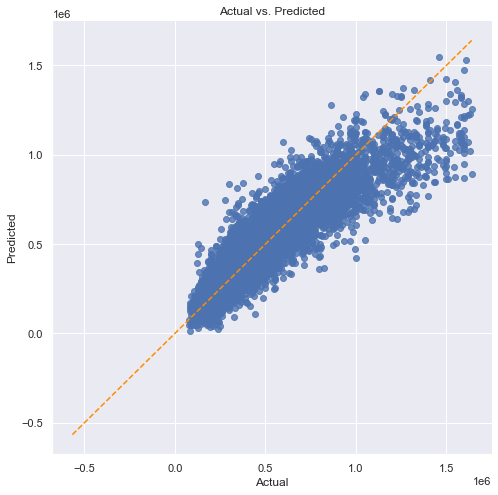

In [60]:
linear_assumption(model, X_train, y_train)

In [61]:
# This function checks to see if our residuals are normally distributed.
def normal_errors_assumption(model, features, label, p_value_thresh=0.05):    
    # Calculating residuals 
    df_results = calculate_residuals(model, features, label)
    
    # Plotting the residuals distribution
    plt.subplots(figsize=(12, 6))
    plt.title('Distribution of Residuals')
    sns.distplot(df_results['Residuals'])
    plt.show()

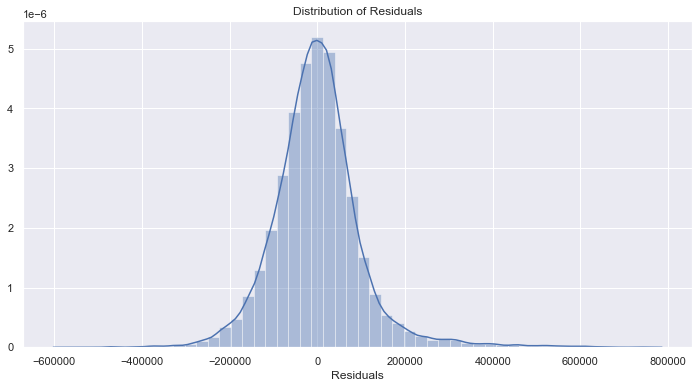

In [62]:
normal_errors_assumption(model, X_train, y_train)

In [89]:
# This functions checks for homoscedasticity in our model.
def homoscedasticity_assumption(model, features, label):
    # Calculating residuals for the plot
    df_results = calculate_residuals(model, features, label)

    # Plotting the residuals
    plt.subplots(figsize=(12, 6))
    ax = plt.subplot(111)  # To remove spines
    plt.scatter(x=df_results.index, y=df_results.Residuals, alpha=0.5)
    plt.plot(np.repeat(0, df_results.index.max()), color='darkorange', linestyle='--')
    ax.spines['right'].set_visible(False)  # Removing the right spine
    ax.spines['top'].set_visible(False)  # Removing the top spine
    plt.title('Residuals')
    plt.show()  

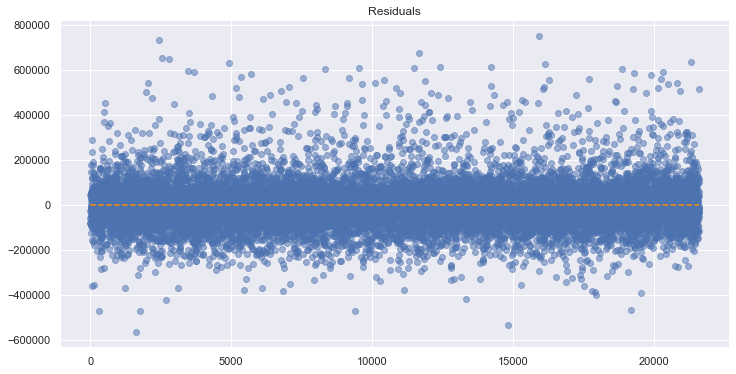

In [90]:
homoscedasticity_assumption(model, X_train, y_train)

## Normality

The following graphs show that our data is normally distbuted, thus confirming our OLS model, which we used to run our Linear Regression and Cross Validation models. We can see a slight right tail skew in our Distribution of Residuals model, but that could be due to the over priced homes in our data set. 

## Results

As we can see, our Test model is slightly overfit, but overall the RMSEs between both our training and testing datasets are very close in value.This means that when we take our testing data, and run it against our training model, that our data is mostly accurate when we run our linear regression model. This is further supported by the Cross Validation Model we run, which gives us an RMSE similar to that of our linear regression model. We also notice that the R-squared values of are linear regression and cross validation (using linear regression) are the same value of 0.817. Which is also really good.

Now, what does this all imply? Well, according to statistical analysis a high R-squared (normally above .70) means that our goodness-of-fit value for our linear regression model is reliable. This means that the amount of bias between our observed and predicted values is very small, making the model a more reliable source to work with when making conclusions with this dataset. According to our cross validation and linear regression models, Roughly 81% of our data can be explained with our model.

Now, where does RMSE come into play? Our RMSE tells us how spread out our residuals, or predicted errors, are from the line of best fit - or, their consentration around the line of best fit. According to our linear regression model, our RMSEs were very close in value (approximately a 613 difference in value). Our testing set being higher means that it is slightly overfit, but that is normaly expected since the testing set normally doesn't fully align with our training set because our training set wa specifically trained on it's set - our testing set wasn't. What is also interesting to note is that our cross validation model using linear regression has an RMSE that is higher. However, this is due to the fact that cross validation is testing multiple portions of our linear regression against different training sets, averagin them out in the end, and producing a much more reliable model.

In conclusion, my model is very reliable according to both the cross validation and linear regression models that I ran. Most of the data can be accounted for and it is can be used as a reliable source when determining why housing prices in King County, Washington are the way that they are. 

## Question 1: Location

## Latitude and Longitude's affect on housing cost

According to our dataset, The latitudinal and longitudinal location of the homes in this data set effect the price of the homes in King County. In folium, I created a color coded map showing the prices of these homes and where they can be found in King County, Washington.

In [65]:
# The folloqing function centers the map location for the map we will be creating in folium.
def get_center_latlong(df):
    #The minimum values for lat anf long are subtracted from the maximum values of lat and long in our dataset. 
    centerlat = (kc_data_fin['lat'].max() + kc_data_fin['lat'].min()) / 2
    centerlong = (kc_data_fin['long'].max() + kc_data_fin['long'].min()) / 2
    return centerlat, centerlong

In [66]:
# Locate center of map.
center = get_center_latlong(kc_data_fin)

# Using the min and max housing prices as our color range for home value.
colormap = cm.LinearColormap(colors=['green', 'yellow', 'red'], vmin=78000, vmax=1640000)

#create our folium map 
m = folium.Map(location=center, zoom_start=10)

#Iterate through our housing data using our lat and long in order to determine the homes location on the map.
#Then color code the circle according to it's price 
for i in range(len(kc_data_fin)):
    folium.Circle(
        location=[kc_data_fin.iloc[i]['lat'], kc_data_fin.iloc[i]['long']],
        radius=10,
        fill=True,
        color=colormap(kc_data_fin.iloc[i]['price']),
        fill_opacity=0.2
    ).add_to(m)

m.add_child(colormap)

m.save('latlong_home_price.html')

## Latitude and Longitude Conclusion

Looking at our map, we can see that, for the most part, that homes within the northern half of King County, Washington are highly priced as compared to the southern half of the county. We also notice that areas like Seattle, Mercer Island, Bellevue, and Kirkland would be out of the price range for most low to middle class families seeking a large family home. We can also see that homes loacated around central Lake Washington would also be out of the price range for most families seeking to live in this area. However, the county does have affordable homes in the southern half of the county, as well as in the northern half. Homebuyers seeking affordable housing can buy homes in these areas, but they would be far from the hub of the cities, beautiful waterways, and parks. 

## The Affect of Zipcode on Housing Price

Zipcode also plays an important role when it comes to housing price. In order to create a map showing the affect of a homes zipcode location on price, I used folium in order to create a Chropleth map. In essence, I mapped my data over a pre-made Choropleth map (a map that contains a pre-made outline of a region) and then color coded it using the mean price value for that zipcode. 

I acquired the map from the following website: https://gis-kingcounty.opendata.arcgis.com/datasets/e6c555c6ae7542b2bdec92485892b6e6_113



In [67]:
zipcode_df = pd.concat([kc_data_fin['price'], kc_data['zipcode']], axis=1)
zipcode_df.isnull().sum()

price      2080
zipcode       0
dtype: int64

In [68]:
zipcode_df.dropna(how='any', inplace=True)
zipcode_df.isnull().sum()

price      0
zipcode    0
dtype: int64

In [69]:
#turns or values for zipcode into strings so that they can match the values on our geojson file
zipcode_df['zipcode'] = zipcode_df['zipcode'].astype('str')


#Loads geojson file that contais boundries and zipcode boundries for King County, Washington.
boundary_file = "geojson_files/Zipcodes_for_King_County_and_Surrounding_Area___zipcode_area.geojson"
with open(boundary_file, 'r') as f:
    zipcode_boundary = json.load(f)


center = get_center_latlong(kc_data_fin)


m = folium.Map(location=center, 
               zoom_start=10, 
               tiles='Stamen Toner')


#Sort by zipcode so that we can properly graph our zipcode data over geojson file
zipcode_data = zipcode_df.groupby('zipcode').aggregate(np.mean)
zipcode_data.reset_index(inplace = True)


folium.Choropleth(
    geo_data=zipcode_boundary,
    name='choropleth',
    data=zipcode_data,
    columns=['zipcode', 'price'],
    key_on='feature.properties.ZIPCODE',
    fill_color='Spectral',
    fill_opacity=0.6,
    nan_fill_opacity=0,
    line_opacity=1,
    legend_name='Mean Price'
).add_to(m)


m.save('zipcode_choropleth.html')

m

## Zipcode Conclusion

As we can see on our map, affordable homes for lower to middle class families can be found on the outer zipcodes of King County. Specifically the southern and eastern parts of the county. Areas around Seattle and Mercer Island are not affordable for most families, however the zipcodes south of Seattle and Mercer Island are around 400K or less. So familes seeking an affordable home should look in the zipcodes within Mapple Valley, Hobart, Black Diamond, Enumclaw, Lea Hill, and Algona Pacific. But, sadly, these areas are far from the Seattle area.  

## Question 2: Home Attributes

Home attributes are defined as the physical features of the home. For our purposes, these features are the number of bathrooms, the number of bedrooms, number of floors, square foot living and basement space of the home, and the condition of the home.We will look at how each of these attributes affects the price of the home in this section.

## Affect of the Number of Bathrooms, Bedrooms, and Floors on the Price of a Home

The following bar graph and boxplots were made using seaborn. The median was used as the estimator for the bar graph because of the outliers that are still present within the data. The mean, unlike the median, can be distorted by outliers, therefore in this scenario the median was used as our measure of central tendency for the bar graph. For the boxplots, the outliers were removed by setting showfliers to false.

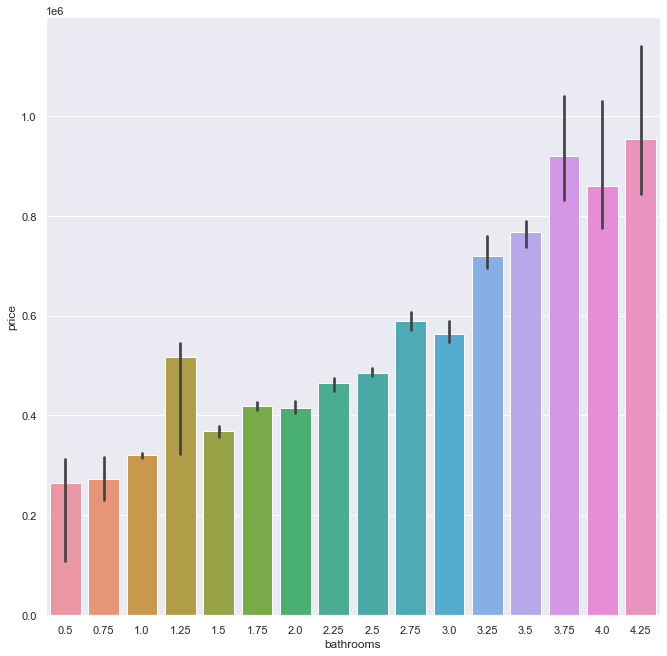

In [70]:
sns.barplot(x="bathrooms", y="price", data=kc_data_fin, estimator = median)

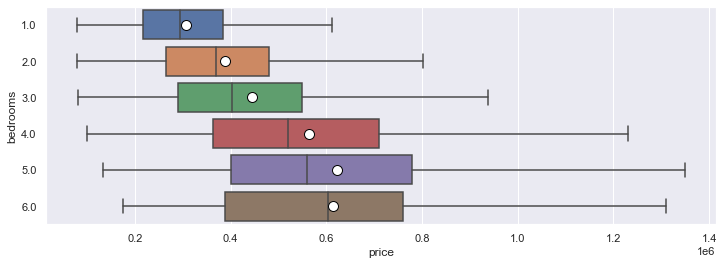

In [71]:
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(y = 'bedrooms', 
            x = 'price', 
            data = kc_data_fin, 
            width = 0.8,   
            showmeans = True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"10"},
            fliersize = 3,
            showfliers = False,
            orient="h",
            ax = ax)

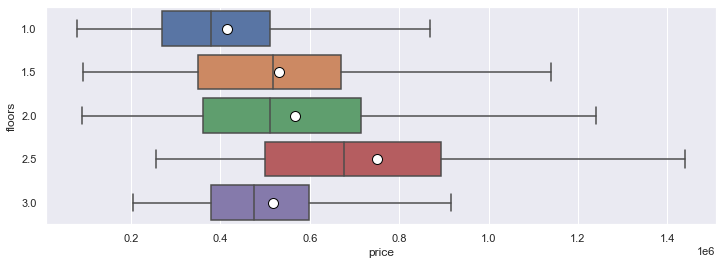

In [72]:
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(y = 'floors', 
            x = 'price', 
            data = kc_data_fin, 
            width = 0.8,   
            showmeans = True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"10"},
            fliersize = 3,
            showfliers = False,
            orient="h",
            ax = ax)

## Bedrooms, Bathrooms, and Floors Conclusion

According to the bar graph, as the number of bathrooms increase in a home, so does the price of the home. However, there is one small outlier, in which a home with a full bath and a quarter bath sells for a higher price than a home with up to 2 3/4 bathrooms. Possibly, families are looking for a home with a full bath and a quarter bath thinking it is cheaper, but I do not have the data to confirm that. But middle to low class families may want to seek a home with two full baths, since they average roughly around 400k.

It seems that the amount of bedrooms does have an affect on home price. We can also see that at just two bedrooms in a home, the mean price is roughly 400K, making an inexpensive home with multiple bedrooms an expense that larger families may not be able to afford. However, families of three should look into a two bedroom home because it is more affordable. 

Finally, the amount of floors in a home does have an affect on home value. However, it seems that a three floor home is cheaper than a two floor home, which could be a better alternative to families since the eman price is around 500K. The more floors to a home in King County, the more expensive it is for most families to afford. Most families should seek a one floor home, since thet roughly run around 400K.

## The Affect of Square Foot Living and Basement Space on the Price of a Home

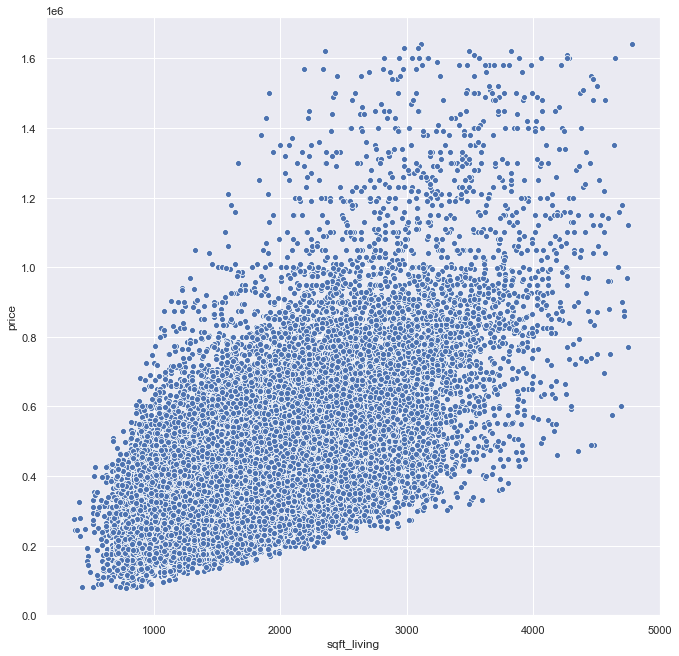

In [73]:
sns.scatterplot(data=kc_data_fin, x="sqft_living", y="price")

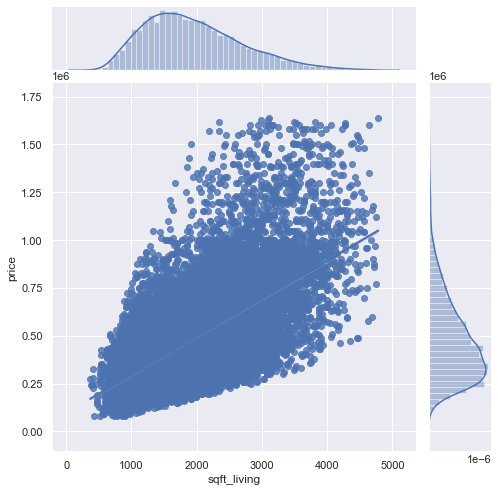

In [74]:
sns.jointplot(x="sqft_living", y="price", data=kc_data_fin, kind = 'reg', size = 7)
plt.show()

In [75]:
def zero_to_nan(values):
    """Replace every 0 with 'nan' and return a copy."""
    return [float('nan') if x==0 else x for x in values]

kc_data_fin['sqft_basement'] = zero_to_nan(kc_data_fin['sqft_basement'])

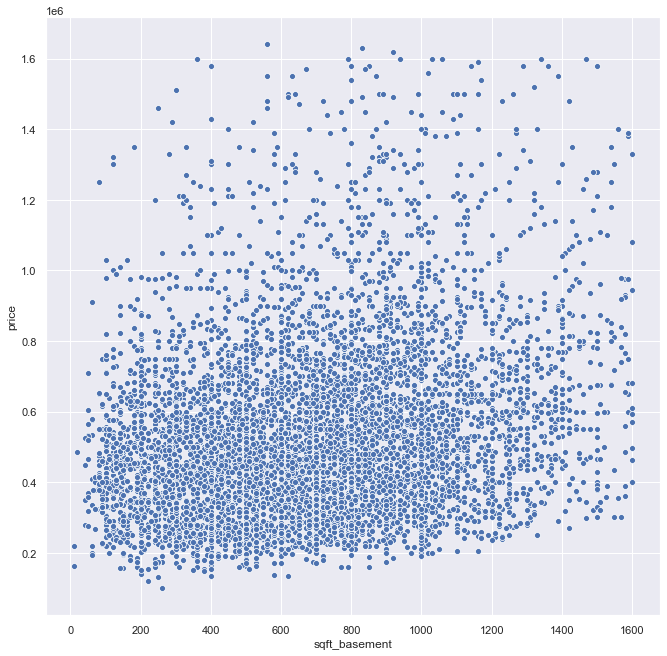

In [76]:
sns.scatterplot(data=kc_data_fin, x="sqft_basement", y="price")

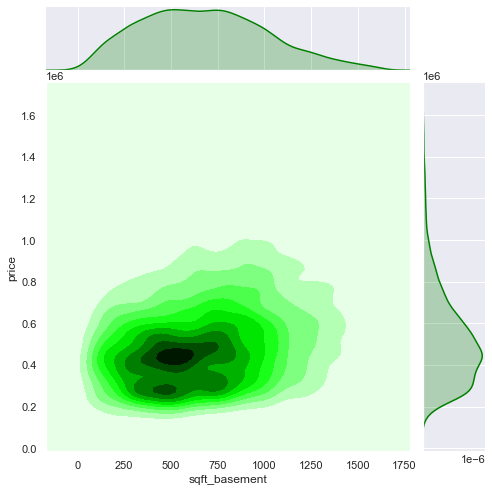

In [77]:
sns.jointplot(x="sqft_basement", y="price", data=kc_data_fin, kind = 'kde', color='green', size = 7)

## Squarefoot Living and Squarefoot Basement Conclusion

The scatterplots jointplots, and kde above show that as the square footage of a home increases, then so does the homes value. This relationship is very strong when it comes to squarefoot living and price. We can clearly see a strong positive correlation between price and the total square footage of a home in King County. This is not as strongly shown when it comes to basements, but basements do increase the value of a home. Homebuyers looking for an affordable home may want to look for a home with a basement square footage of 400 (if the home buyer wants a basement) and a home that has a living square footage of 2,000. These homes average around 400k, which may be dooable for a middle class or lower income family.

## Affect of Home Condition on Price

In [78]:
condition_df = pd.concat([kc_data_fin['price'], kc_data['condition']], axis=1)
condition_df.dropna(how='any', inplace=True)

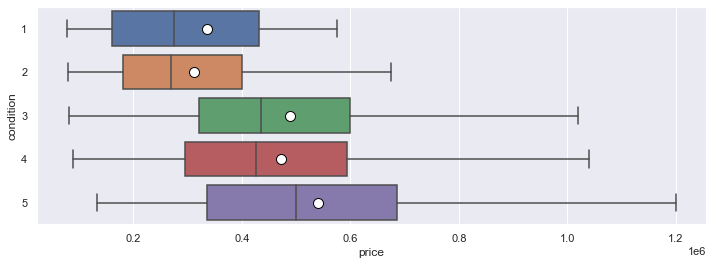

In [79]:
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(y = 'condition', 
            x = 'price', 
            data = condition_df, 
            width = 0.8, 
            orient = 'h',  
            showmeans = True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"10"},
            fliersize = 3,
            showfliers = False,
            ax = ax)

As can be seen by the boxplot (excluding a condition of 1, according to our finalized dataset), a higher home condition does affect the homes value. A family seeking an affordable home may want to purchase a home with a condition of around 2. However, this may mean that the home is a fixer upper, meaning a homebuyer will most likely have to invest more money into the home after purchase.

## Home Attributes Conclusion

As we can see, features of a home do have an affect on the homes price value.In general, the larger the home, the more it has to offer in room and bath, and the overall condition of the home, play an important role in the price of a home in King County, Washington. Overall, attributes of a home seem to make the greatest difference in how much a home will cost. 

## Question 3: External Factors

External factors are considered the environment around the home, in this project. According to my regression model, these factors are if the home is next to a waterfront, the year it was built and the year it was renovated, the square foot of the fifteen nearest homes, and the grade given to the home based upon the King County grading system.

## Waterfront Affect on Home Value

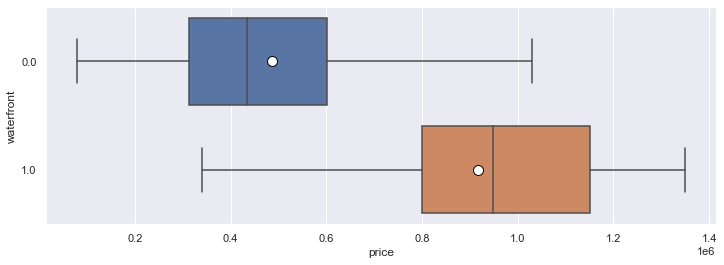

In [80]:
fig, ax = plt.subplots(figsize=(12,4))
sns.boxplot(y = 'waterfront', 
            x = 'price', 
            data = kc_data_fin, 
            width = 0.8, 
            orient = 'h',  
            showmeans = True,
            meanprops={"marker":"o",
                       "markerfacecolor":"white", 
                       "markeredgecolor":"black",
                       "markersize":"10"},
            fliersize = 3,
            showfliers = False,
            ax = ax)

## Waterfront Conclusion

Accroding to the boxplot above, a home near the water front is nearly worth twice as much as a home not near a waterfront. A waterfront home is almost a million dollars in value, and is out of the price range of most families. We can also relate this to our folium map where we saw that homes along areas such as Lake Michigan were more expensive than homes found inland. 

## Year Built and Year Renovated Affect on Home Value

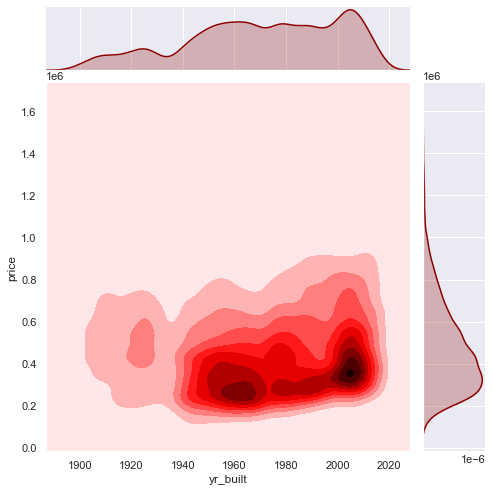

In [81]:
sns.jointplot(x="yr_built", y="price", data=kc_data_fin, kind = 'kde', size = 7, color='darkred')

In [83]:
kc_data_fin['yr_renovated'] = zero_to_nan(kc_data_fin['yr_renovated'])

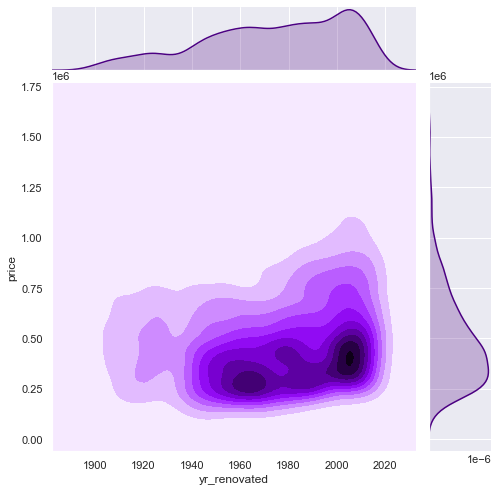

In [84]:

sns.jointplot(x="yr_renovated", y="price", data=kc_data_fin, kind = 'kde', size = 7, color='indigo')

## Year Built and Renovated

Looking at year built and our kde jointplot, we can see that most homes in the King County area have been built very recently (around the year 2000). We can also see that more homes began being built in the 1960s. We can also see that year built doesn't necessarly determine if a home will be more expensive. Most of the homes built between 1960 and 2020 average somewhere between 200k - 400k in price. However, homes renovated between 1960 and 2000 did go up in value. These homes are roughly worth between 250k - 500k. This does show that if a family purchases and then renovates their home, they could make a bigger profit off their home if they wish to sell it in the future.

## Square Foot of Fifteen nearest homes on Home Price

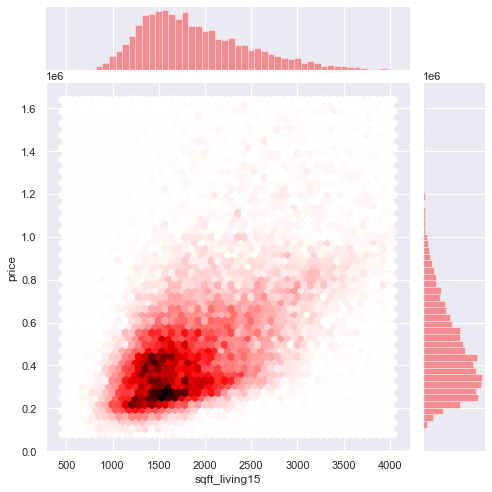

In [85]:
sns.jointplot(x="sqft_living15", y="price", data=kc_data_fin, kind = 'hex', size = 7, color = 'red')

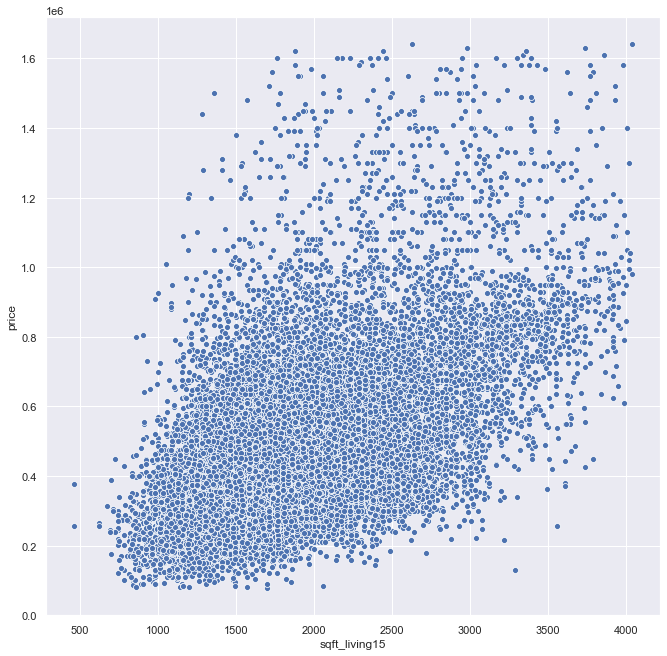

In [88]:
sns.scatterplot(data=kc_data_fin, x="sqft_living15", y="price")

## Square Ft of the 15 Closest Homes Conclsion

Looking at our hex joinplot, we can clearly see a positive correlation between price of a home and sqaure foot living space of the 15 nearest homes. As sqaure footage goes up, so does the price of a home (which, overall, squarre footage seems to be a big determining factor in home price). However, we do notice that most homes fall bewtween 1000 to 2000 square ft and can cause a homes value to be aywhere from 200k - almsot 600k in value. Families seeking an affordable home may want to find a well sized home near many smaller homes.

## Home Grade Affect on Price

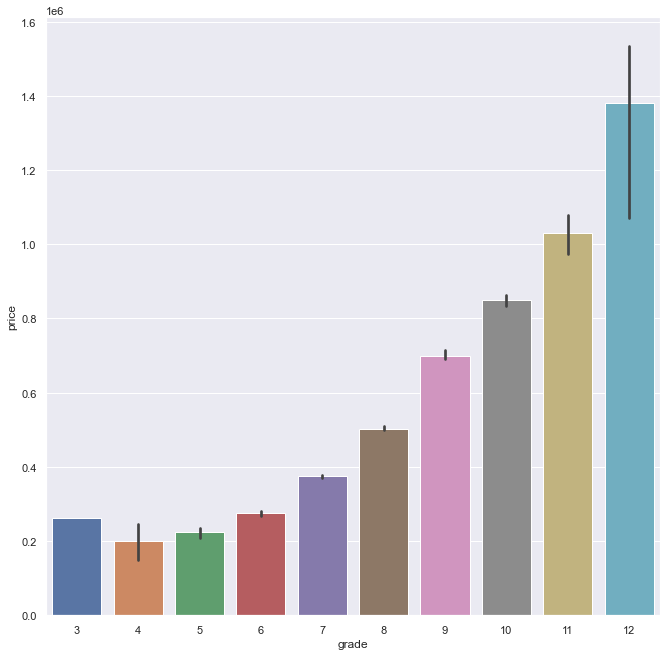

In [86]:
grade_df = pd.concat([kc_data_fin['price'], kc_data['grade']], axis=1)
grade_df.dropna(how='any', inplace=True)


sns.barplot(x="grade", y="price", data=grade_df, estimator = median)

## Grade Conclusion

As can be seen from the bar graph above, grade begins to have a major impact on the cost of a home around a grade of 8. But according to our model, grades of 11 or higher push the price of a home into outrageous prices of over a million. Home buyers should seek a home with a grade of 7 or less, but once purchasing, should try and bring that grae up as high as tey possibly can if they wish to make a profit off of the home in the future.

## View Affect on Home Price

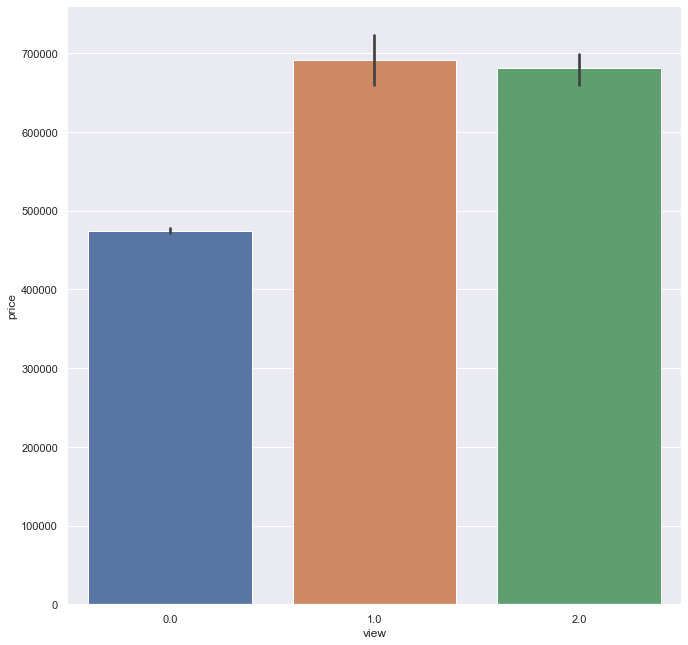

In [87]:
sns.barplot(x="view", y="price", data=kc_data_fin)

## View Conclusion

The bar graph above shows that when a home is viewed by potential buyers, its value goes up from a mean value of around 500K to a value of 700K. However, the more a home is viewed, we notice a slight loss in home price. Ovrall, a viewed homes value is worth more than a non-viewed home.

## External Factors Conclusion

Home price in King County, Washington are influenced by external factors. In particular, waterfront and grades above 8 can have a major factor on home price in the area. We can also see that remodeling a home can bring up the price as well, especially if ones neighbor decides to remodel their home and increase square footage in the process. These external factors are defiitely important to pay attention to for future homeowners in the King County area. Especially for those that wish to make a future profit.